# Example Inference Code with `Patcher`


In [1]:
from pathlib import Path
import sys
import os
import torch

root_dir = Path.cwd().parent.resolve()
sys.path.insert(0, str(root_dir)) 


from models.stiramisu import sFCDenseNet103
from models.att_unet import sAttU_Net

from src.patcher import Patcher
from src.imgs import Img

print("torch.version.cuda:", torch.version.cuda)
print("torch.cuda.is_available():", torch.cuda.is_available())
print("torch.cuda.device_count():", torch.cuda.device_count())
print("CUDA_VISIBLE_DEVICES:", os.environ.get("CUDA_VISIBLE_DEVICES"))

try:
    torch.cuda.current_device()
    print("current_device(): OK")
except Exception as e:
    print("current_device() ERROR:", e)

torch.version.cuda: 12.1
torch.cuda.is_available(): True
torch.cuda.device_count(): 1
CUDA_VISIBLE_DEVICES: None
current_device(): OK


### use the Dataset and Img classes to get normalization coefficients, class names and colors, etc.

number_of_classes: 10


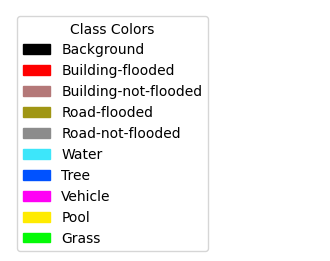

In [2]:
# from datasets.rescuenet import Dataset
# Dataset.stats_from_yaml('rescuenet.yaml')

from datasets.floodnet import Dataset
Dataset.stats_from_yaml('floodnet.yaml')

number_of_classes = len(Dataset.class_names)
print("number_of_classes:", number_of_classes)

img = Img(Dataset)
img.print_dataset_colors()


### Model selection

In [3]:
# comment/uncomment to choose the model you prefer, among the available ones


# tiramisu
model = sFCDenseNet103(n_classes=number_of_classes)
weights_path = root_dir / '.weights' /  'stiramisu-fn.pth'

# # attunet
# model = sAttU_Net(output_ch=number_of_classes)
# weights_path = root_dir / '.weights' /  'sattunet-fn.pth'

weights = torch.load(weights_path)['data']
model.load_state_dict(weights)
model.eval()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
print(' ')

total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

print(f"number of parameters: {total_params}")
print(f"number of trainable parameters: {trainable_params}")

 
number of parameters: 9321834
number of trainable parameters: 9321834


### Load an input image

**Example image.** The example image is a 2000x2000 pixel crop from the orthomosaic of a 3D model built from Hurricane Harvey imagery. The model was created as part of the HaMMon project activities.


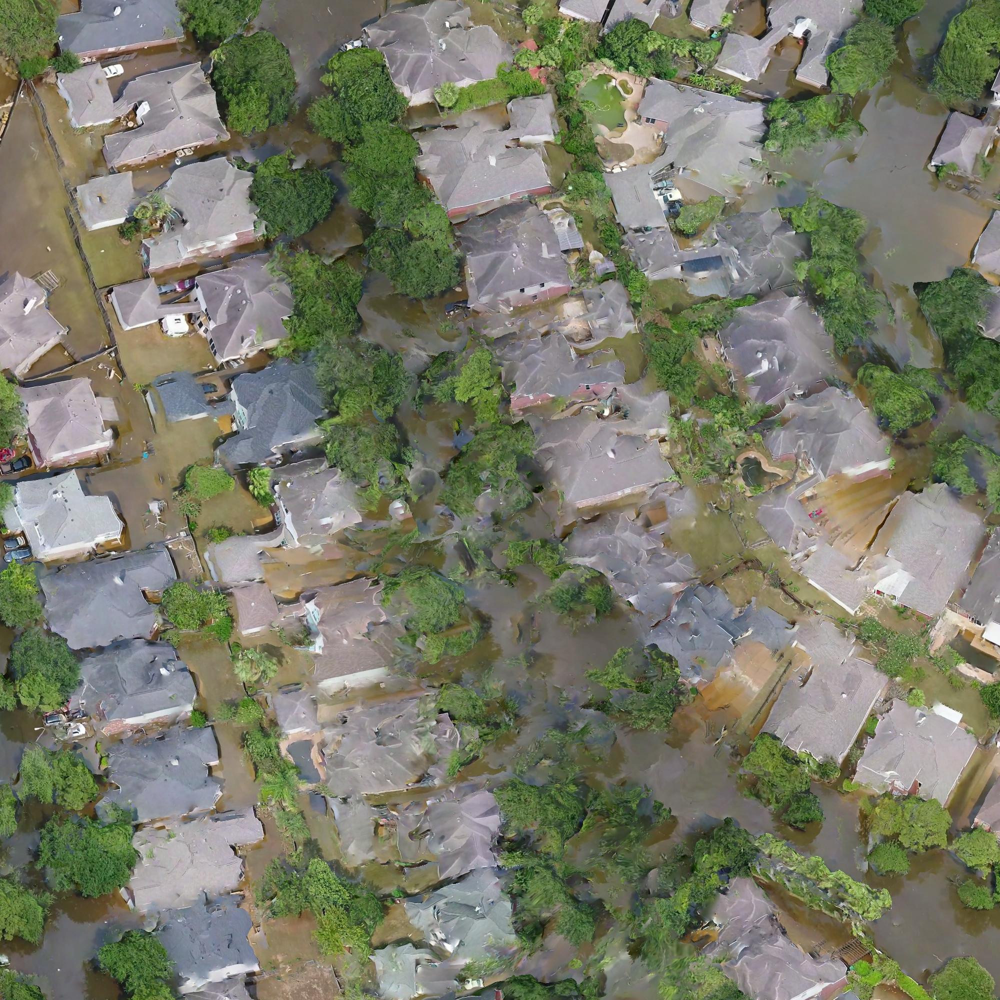

input.shape torch.Size([1, 3, 2000, 2000])


In [4]:
image_path = root_dir / 'notebooks' / 'sample_images' / 'harvey_orthomosaic.jpg'

if not image_path.exists():
    raise FileNotFoundError(f"Image not found: {image_path}")

from PIL import Image
from IPython.display import display

display(Image.open(image_path))

def prepare(img_path, Dataset):
    img = Dataset.load_img(img_path)
    transform = Dataset.transform()
    img = transform(img)
    return img


input = prepare(image_path, Dataset)
input = input.unsqueeze(0)
print(f"input.shape {input.shape}")


### Istantiate the `Patcher` class

In [5]:
patcher = Patcher(model=model, 
                  kernel=(704, 704), 
                  stride=(512, 512), 
                  device=device, 
                  mode='average')
patcher.compute_batch_layout((3,2,1408,704))

{'n_steps': (2, 0),
 'patches': (3, 1),
 'input_size': (1408, 704),
 'canvas_size': (1728, 704),
 'padding': (320, 0),
 'pad_left': 0,
 'pad_right': 0,
 'pad_top': 160,
 'pad_bottom': 160}

### Execute inference

**Inference notes.** The input image is 2000×2000, but inference is performed on a grid of 704×704 patches with a stride of 512, which results in overlapping regions. Along these overlap areas, the predicted probability is averaged.


In [6]:
with torch.no_grad():
    output = patcher(input)
    output = output.argmax(1)
    
type(output), output.shape, output.min(), output.max()

(torch.Tensor,
 torch.Size([1, 2000, 2000]),
 tensor(0, device='cuda:0'),
 tensor(9, device='cuda:0'))

### use the `img` tool to visualize results

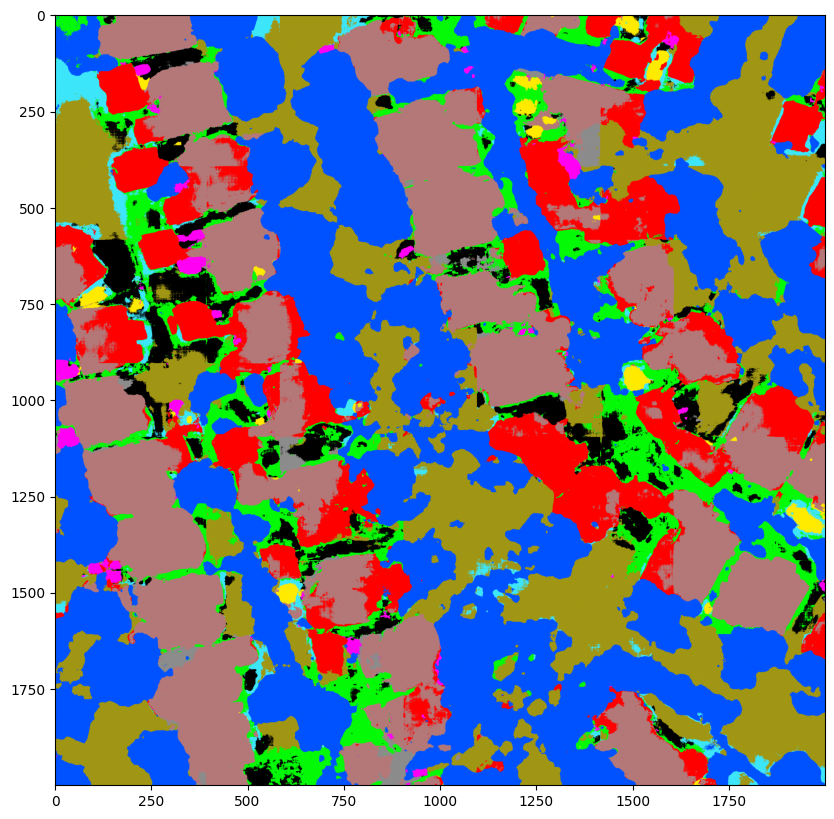

In [7]:
nnp = img.label_to_np(output[0])
img.view_np(nnp)

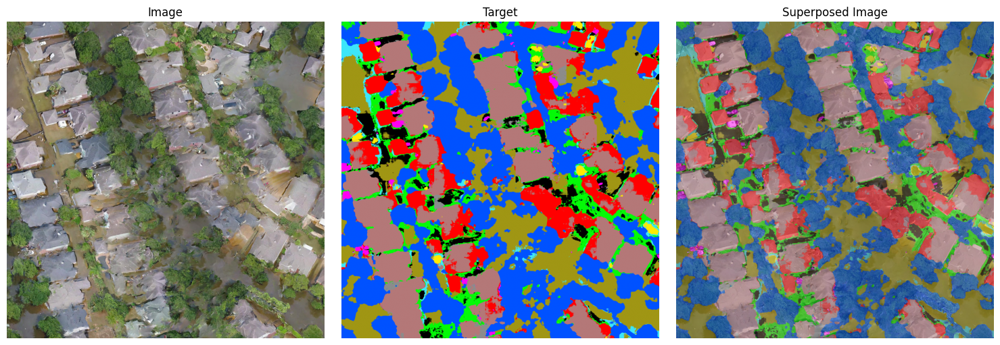

In [8]:

np = img.img_to_np(input.squeeze(0))
img.visualize_images_with_superposition(img.img_to_np(input.squeeze(0)), nnp)